<a href="https://www.kaggle.com/code/anshtanwar/data-analysis-ydata-profiling-top-1000-games?scriptVersionId=138302837" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

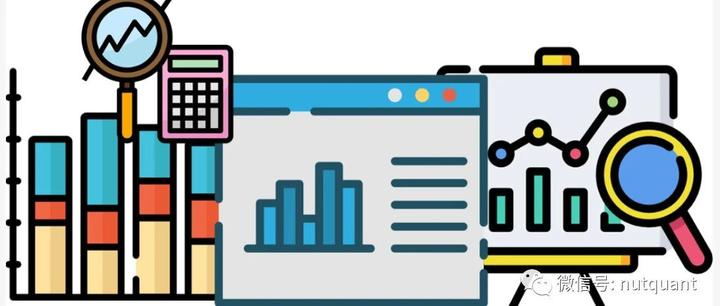

<div style="background-color:#fff1cc; padding: 20px;">Consider upvoting notebook.It helps other people discover them.Feel free to fork or edit the notebook. </div>
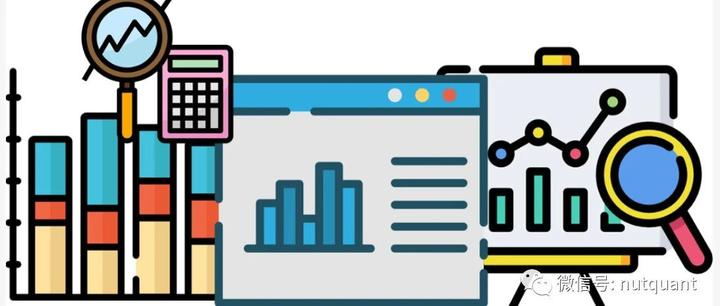

In [1]:
import pandas as pd

def combine_csv(file1_path, file2_path, output_file_path, key_column_file1, key_column_file2):
    # Read both CSV files into pandas DataFrames
    df1 = pd.read_csv(file1_path)
    df2 = pd.read_csv(file2_path)

    # Merge the DataFrames based on the specified key columns
    merged_df = pd.merge(df1, df2, left_on=key_column_file1, right_on=key_column_file2, how='inner')
    return merged_df


file1_path = "/kaggle/input/top-1000-steam-games/steam_app_data.csv"
file2_path = "/kaggle/input/top-1000-steam-games/steamspy_data.csv"
output_file_path = "/kaggle/working/"
key_column_file1 = "steam_appid"
key_column_file2 = "appid"

merged_df = combine_csv(file1_path, file2_path, output_file_path, key_column_file1, key_column_file2)

df = merged_df.copy()
df_original = merged_df.copy()

In [2]:
merged_df.head()

,type,name_x,steam_appid,required_age,is_free,controller_support,dlc,detailed_description,about_the_game,short_description,...,average_2weeks,median_forever,median_2weeks,price,initialprice,discount,languages,genre,ccu,tags
0,game,Counter-Strike,10,0.0,False,NaN,NaN,Play the world's number 1 online action game. ...,Play the world's number 1 online action game. ...,Play the world's number 1 online action game. ...,...,0,0,0,999,999,0,"English, French, German, Italian, Spanish - Sp...",Action,10775,"{'Action': 5448, 'FPS': 4862, 'Multiplayer': 3..."
1,game,Team Fortress Classic,20,0.0,False,NaN,NaN,One of the most popular online action games of...,One of the most popular online action games of...,One of the most popular online action games of...,...,0,0,0,499,499,0,"English, French, German, Italian, Spanish - Sp...",Action,77,"{'Action': 759, 'FPS': 320, 'Multiplayer': 272..."
2,game,Day of Defeat,30,0.0,False,NaN,NaN,Enlist in an intense brand of Axis vs. Allied ...,Enlist in an intense brand of Axis vs. Allied ...,Enlist in an intense brand of Axis vs. Allied ...,...,0,0,0,499,499,0,"English, French, German, Italian, Spanish - Spain",Action,89,"{'FPS': 794, 'World War II': 261, 'Multiplayer..."
3,game,Deathmatch Classic,40,0.0,False,NaN,NaN,Enjoy fast-paced multiplayer gaming with Death...,Enjoy fast-paced multiplayer gaming with Death...,Enjoy fast-paced multiplayer gaming with Death...,...,0,0,0,499,499,0,"English, French, German, Italian, Spanish - Sp...",Action,8,"{'Action': 633, 'FPS': 147, 'Classic': 113, 'M..."
4,game,Half-Life: Opposing Force,50,0.0,False,NaN,NaN,Return to the Black Mesa Research Facility as ...,Return to the Black Mesa Research Facility as ...,Return to the Black Mesa Research Facility as ...,...,0,0,0,499,499,0,"English, French, German, Korean",Action,162,"{'FPS': 905, 'Action': 343, 'Classic': 271, 'S..."


In [3]:
missing_values = merged_df.isnull().sum()
print(missing_values)

type                         6
name_x                       0
steam_appid                  0
required_age                 6
is_free                      6
controller_support         587
dlc                        440
detailed_description         6
about_the_game               6
short_description            6
fullgame                   994
supported_languages          6
header_image                 6
website                    126
pc_requirements              6
mac_requirements             6
linux_requirements           6
legal_notice               274
drm_notice                 923
ext_user_account_notice    883
developers                   7
publishers                   6
demos                      887
price_overview             279
packages                   206
package_groups               6
platforms                    6
metacritic                 412
reviews                    623
categories                   8
genres                       8
screenshots                  6
movies  

# <div style="background-color:#fff1cc; padding: 20px;">📈Cleaning Dataset</div>

In [4]:
#drop columns with all null values
df.dropna(axis=1, how='all', inplace=True)

#Drop Columns with More Than 80% Missing Values
threshold = 0.8  # Set the threshold for the percentage of missing values
columns_to_drop = df.columns[df.isnull().mean() > threshold]
df.drop(columns=columns_to_drop, inplace=True)

In [5]:
import pandas as pd

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
categorical_numerical_columns = df.select_dtypes(include=['int64']).columns
continuous_numerical_columns = df.select_dtypes(include=['float64']).columns
text_columns = df.select_dtypes(include=['object']).columns

print("Numerical Columns:")
print("All Numerical Columns:", numerical_columns)
print("Categorical Numerical Columns:", categorical_numerical_columns)
print("Continuous Numerical Columns:", continuous_numerical_columns)

print("\nText Columns:")
print(text_columns)

Numerical Columns:
All Numerical Columns: Index(['steam_appid', 'required_age', 'appid', 'positive', 'negative',
       'userscore', 'average_forever', 'average_2weeks', 'median_forever',
       'median_2weeks', 'price', 'initialprice', 'discount', 'ccu'],
      dtype='object')
Categorical Numerical Columns: Index(['steam_appid', 'appid', 'positive', 'negative', 'userscore',
       'average_forever', 'average_2weeks', 'median_forever', 'median_2weeks',
       'price', 'initialprice', 'discount', 'ccu'],
      dtype='object')
Continuous Numerical Columns: Index(['required_age'], dtype='object')

Text Columns:
Index(['type', 'name_x', 'is_free', 'controller_support', 'dlc',
       'detailed_description', 'about_the_game', 'short_description',
       'supported_languages', 'header_image', 'website', 'pc_requirements',
       'mac_requirements', 'linux_requirements', 'legal_notice', 'developers',
       'publishers', 'price_overview', 'packages', 'package_groups',
       'platforms', 'meta

In [6]:
import pandas as pd
import numpy as np
import string
from nltk.corpus import stopwords



#Handling Missing Values 
for column in numerical_columns:
    if df[column].dtype == 'object':  # Convert numeric columns stored as objects to numeric data type
        df[column] = pd.to_numeric(df[column], errors='coerce')

    if df[column].isnull().any():  # Check if the column contains missing values
        if df[column].dtype == np.number:  # Numerical column
            median_value = df[column].median()
            df[column].fillna(median_value, inplace=True)
        else:  # Categorical column 
            mode_value = df[column].mode().iloc[0]
            df[column].fillna(mode_value, inplace=True)

#Handling Text Data

for column in text_columns:
    df[column] = df[column].apply(lambda x: x.lower() if isinstance(x, str) else x)  # Convert text to lowercase

    # Remove punctuation from text
    df[column] = df[column].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)) if isinstance(x, str) else x)

    # Remove stopwords from text
    stop_words = set(stopwords.words('english'))
    df[column] = df[column].apply(lambda x: ' '.join([word for word in x.split() if word not in stop_words]) if isinstance(x, str) else x)

# Step 4: Drop Rows with Missing Values (for any remaining missing values in rows)
df.dropna(axis=0, how='any', inplace=True)




/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/tmp/ipykernel_20/10862328.py:14: DeprecationWarning: Converting `np.inexact` or `np.floating` to a dtype is deprecated. The current result is `float64` which is not strictly correct.
  if df[column].dtype == np.number:  # Numerical column


<div style="background-color:#fff1cc; padding: 30px;">NOTE: A profiling report is a comprehensive summary and analysis of a dataset that provides a detailed overview of its characteristics, including data types, missing values, summary statistics, distributions, correlations, and more</div>

In [7]:
!pip install pandas-profiling


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 30.2 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.11.1
    Uninstalling scipy-1.11.1:
      Successfully uninstalled scipy-1.11.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
momepy 0.6.0 requires shapely>=2, but you have shapely 1.8.5.post1 which is incompatible.
pymc3 3.11.5 requires numpy<1.22.2,>=1.15.0, but you have numpy 1.23.5 which is incompatible.
pymc3 3.11.5 requires scipy<1.8.0,>=1.7.3, but you have scipy 1.10.1 which is incompatible.


# <div style="background-color:#fff1cc; padding: 20px;">📈Let us use ydata-profiling</div>

In [8]:
import pandas as pd
from ydata_profiling import ProfileReport
profile = ProfileReport(df,title="Steam", explorative=True,)
profile.to_file("output1.html")


/opt/conda/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/opt/conda/lib/python3.10/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
from IPython.display import HTML # import the HTML object
HTML(filename='output1.html') # render the file as a web page

Number of variables,54
Number of observations,68
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,1.8 MiB
Average record size in memory,27.3 KiB
Categorical,14
Text,31
Numeric,8
